## Цель
- Сделайте генератор лиц аниме на основе [датасета](https://www.kaggle.com/datasets/soumikrakshit/anime-faces)

In [30]:
import torchvision as tv
import matplotlib.pyplot as plt
import torch
from torch import nn
from torchsummary import summary
import matplotlib.pyplot as plt

In [32]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cpu')

## Dataset

In [2]:
# !kaggle datasets download -d soumikrakshit/anime-faces

In [3]:
image_path = r'anime-faces\data'

In [4]:
transform = tv.transforms.Compose([
    tv.transforms.ToTensor(),
])

In [5]:
dataset = tv.datasets.ImageFolder(
    image_path,
    transform=transform
)

In [25]:
BATCH_SIZE = 256
dl = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

In [27]:
CHANNELS = 3
input_shape = (3, 64, 64)

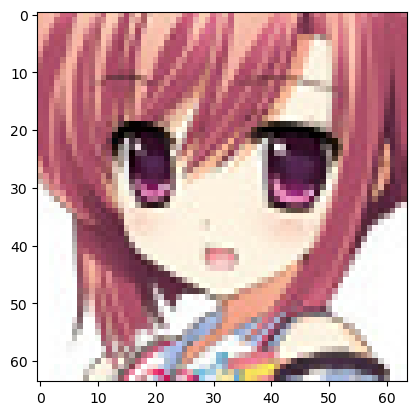

In [14]:
plt.imshow(dataset[0][0].numpy().transpose((1, 2, 0)))

## Примечание
- все гиперпараметры были взяты из [этого примера](https://www.kaggle.com/code/sparrow574/gen-anime-faces)

## Generator

In [51]:
LATENT_DIM = 100
G = nn.Sequential(
    nn.Linear(LATENT_DIM, 8 * 8 * 512),
    nn.ReLU(),
    nn.Unflatten(1, (512, 8, 8)),
    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
    nn.ReLU(),
    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
    nn.ReLU(),
    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
    nn.ReLU(),
    nn.Conv2d(64, CHANNELS, kernel_size=4, padding=1),
    nn.Upsample(size=(64, 64), mode='bilinear', align_corners=False),
    nn.Tanh()
).to(device)

In [52]:
summary(G, input_size=(LATENT_DIM,), device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                [-1, 32768]       3,309,568
              ReLU-2                [-1, 32768]               0
         Unflatten-3            [-1, 512, 8, 8]               0
   ConvTranspose2d-4          [-1, 256, 16, 16]       2,097,408
              ReLU-5          [-1, 256, 16, 16]               0
   ConvTranspose2d-6          [-1, 128, 32, 32]         524,416
              ReLU-7          [-1, 128, 32, 32]               0
   ConvTranspose2d-8           [-1, 64, 64, 64]         131,136
              ReLU-9           [-1, 64, 64, 64]               0
           Conv2d-10            [-1, 3, 63, 63]           3,075
         Upsample-11            [-1, 3, 64, 64]               0
             Tanh-12            [-1, 3, 64, 64]               0
Total params: 6,065,603
Trainable params: 6,065,603
Non-trainable params: 0
---------------------------

## Discriminator

In [54]:
alpha = 0.2
D = nn.Sequential(
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(), # negative_slope=alpha
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(),
    nn.Conv2d(128, 128, kernel_size=4, stride=2, padding=1),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(),
    nn.Flatten(),
    nn.Dropout(0.3),
    nn.Linear(128 * 8 * 8, 1),
    nn.Sigmoid()
).to(device)

In [57]:
summary(D, input_size=input_shape, device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           3,136
       BatchNorm2d-2           [-1, 64, 32, 32]             128
         LeakyReLU-3           [-1, 64, 32, 32]               0
            Conv2d-4          [-1, 128, 16, 16]         131,200
       BatchNorm2d-5          [-1, 128, 16, 16]             256
         LeakyReLU-6          [-1, 128, 16, 16]               0
            Conv2d-7            [-1, 128, 8, 8]         262,272
       BatchNorm2d-8            [-1, 128, 8, 8]             256
         LeakyReLU-9            [-1, 128, 8, 8]               0
          Flatten-10                 [-1, 8192]               0
          Dropout-11                 [-1, 8192]               0
           Linear-12                    [-1, 1]           8,193
          Sigmoid-13                    [-1, 1]               0
Total params: 405,441
Trainable params:

## Train

In [58]:
# loss
criterion = nn.MSELoss()

# optimizer
G_lr = 0.0003
D_lr = 0.0001
G_optimizer = torch.optim.Adam(G.parameters(), lr = G_lr, betas=(0.5, 0.999))
D_optimizer = torch.optim.Adam(D.parameters(), lr = D_lr, betas=(0.5, 0.999))

In [59]:
def D_train(x):
    #=======================Train the discriminator=======================#
    D.zero_grad()
    
    # train discriminator on real
    x_real, y_real = x.to(device), torch.ones(BATCH_SIZE, 1).to(device)
    y_real += 0.05 * torch.rand(y_real.size())

    y_pred_real = D(x_real)
    D_real_loss = criterion(y_pred_real, y_real)
    
    # train discriminator on facke
    random_noise = torch.randn(BATCH_SIZE, LATENT_DIM).to(device)
    x_fake, y_fake = G(random_noise), torch.zeros(BATCH_SIZE, 1).to(device)
    
    y_pred_fake = D(x_fake)
    D_fake_loss = criterion(y_pred_fake, y_fake)
    
    # gradient backprop & optimize ONLY D's parameters
    D_loss = (D_real_loss + D_fake_loss) / 2
    D_loss.backward()
    D_optimizer.step()
        
    return D_loss.data.item()

In [62]:
def G_train(x):
    #=======================Train the generator=======================#
    G.zero_grad()

    random_noise = torch.randn(BATCH_SIZE, LATENT_DIM).to(device)
    labels = torch.ones(BATCH_SIZE, 1).to(device)

    fake_images = G(random_noise)
    pred_fake = D(fake_images)
    G_loss = criterion(labels, pred_fake)

    # gradient backprop & optimize ONLY G's parameters
    G_loss.backward()
    G_optimizer.step()
        
    return G_loss.data.item()

После каждой эпохи будем смотреть на результат

In [92]:
def show_example():

    G.train(False)
    random_numbers = torch.randint(low=0, high=BATCH_SIZE, size=(5,)).tolist()
    random_noise = torch.randn(BATCH_SIZE, LATENT_DIM).to(device)
    g_img = G(random_noise)

    g_img = (g_img - g_img.min())/(g_img.max() - g_img.min())

    fig = plt.figure(figsize=(8, 8))
    for i, x in enumerate(random_numbers):
        plt.subplot(1, 5, i+1)
        img = g_img[].detach().numpy()
        plt.imshow(img.transpose((1, 2, 0)))
        plt.axis('off')

    plt.show()

Примечание:
- тут первая эпоха это по факту 5ая эпоха, первые 4 я запускал отдельно

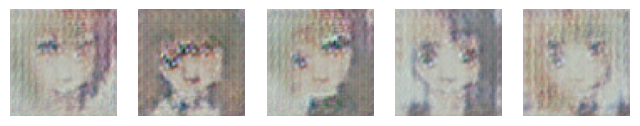

[0/100]: loss_d: 0.185, loss_g: 0.534


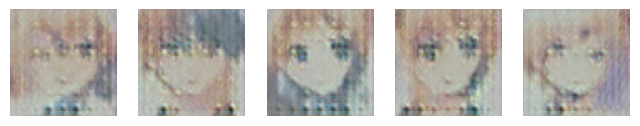

[1/100]: loss_d: 0.198, loss_g: 0.512


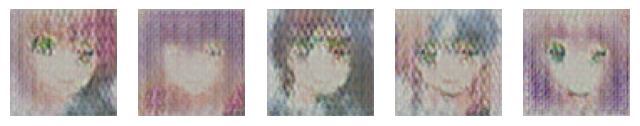

[2/100]: loss_d: 0.187, loss_g: 0.526


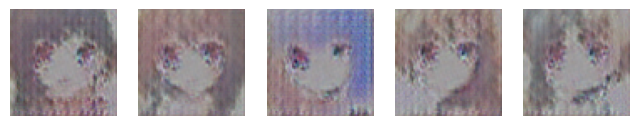

[3/100]: loss_d: 0.184, loss_g: 0.552


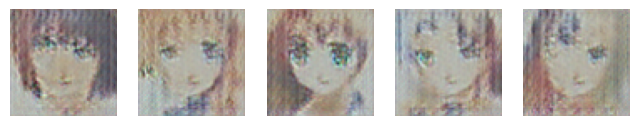

[4/100]: loss_d: 0.183, loss_g: 0.554


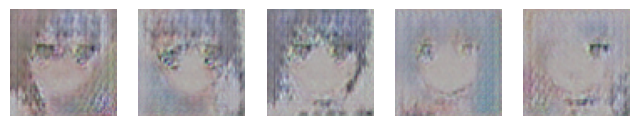

[5/100]: loss_d: 0.184, loss_g: 0.567


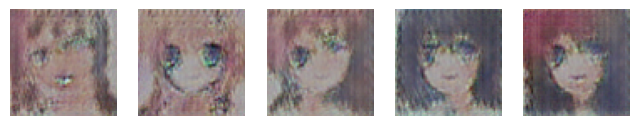

[6/100]: loss_d: 0.186, loss_g: 0.548


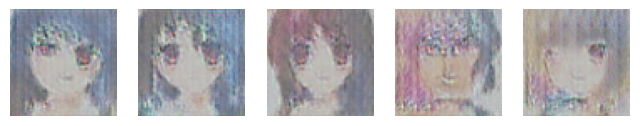

[7/100]: loss_d: 0.185, loss_g: 0.564


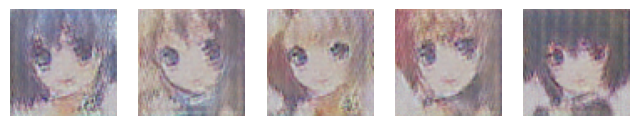

[8/100]: loss_d: 0.181, loss_g: 0.557


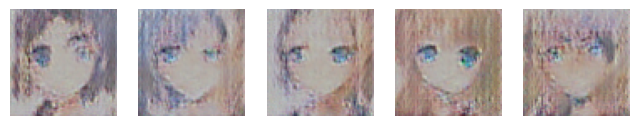

[9/100]: loss_d: 0.181, loss_g: 0.556


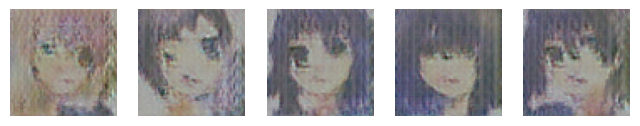

[10/100]: loss_d: 0.188, loss_g: 0.555


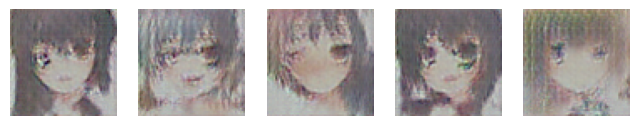

[11/100]: loss_d: 0.176, loss_g: 0.570


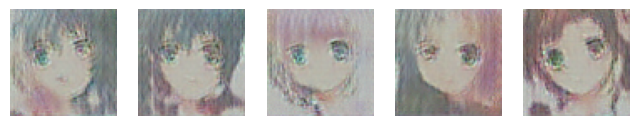

[12/100]: loss_d: 0.174, loss_g: 0.569


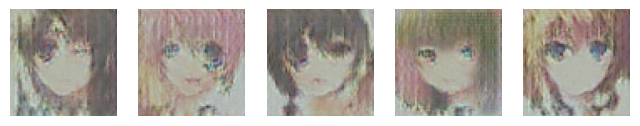

[13/100]: loss_d: 0.175, loss_g: 0.542


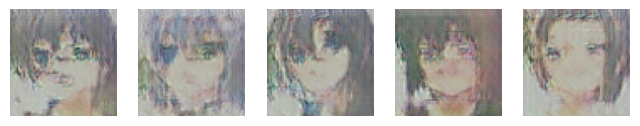

[14/100]: loss_d: 0.167, loss_g: 0.558


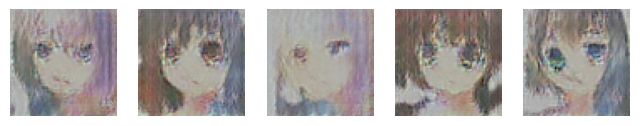

[15/100]: loss_d: 0.163, loss_g: 0.565


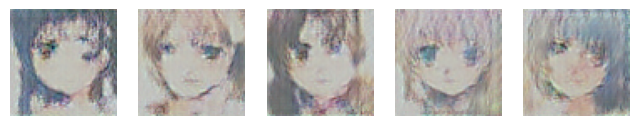

[16/100]: loss_d: 0.158, loss_g: 0.572


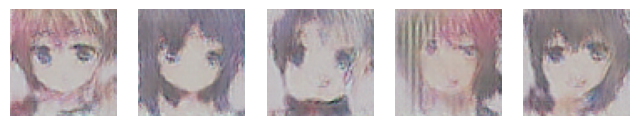

[17/100]: loss_d: 0.154, loss_g: 0.586


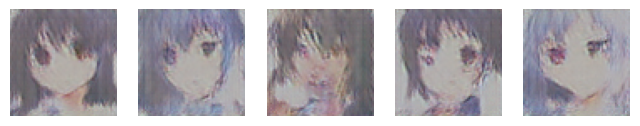

[18/100]: loss_d: 0.147, loss_g: 0.614


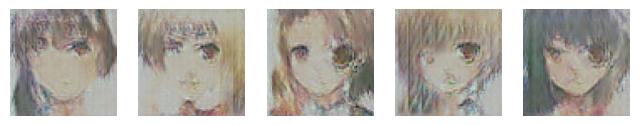

[19/100]: loss_d: 0.148, loss_g: 0.615


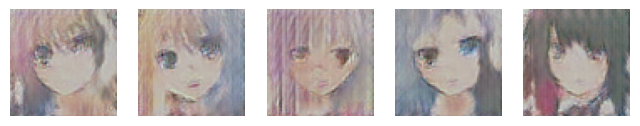

[20/100]: loss_d: 0.155, loss_g: 0.588


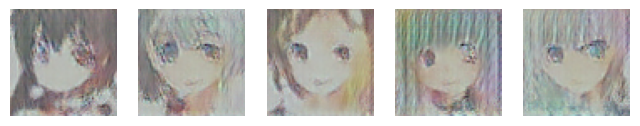

[21/100]: loss_d: 0.147, loss_g: 0.623


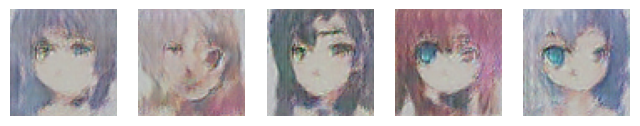

[22/100]: loss_d: 0.153, loss_g: 0.607


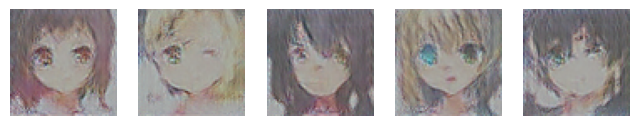

[23/100]: loss_d: 0.161, loss_g: 0.576


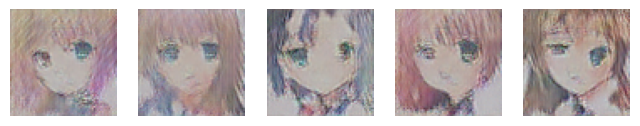

[24/100]: loss_d: 0.168, loss_g: 0.566


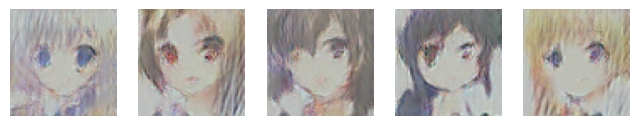

[25/100]: loss_d: 0.167, loss_g: 0.571


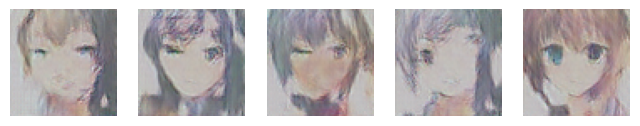

[26/100]: loss_d: 0.167, loss_g: 0.545


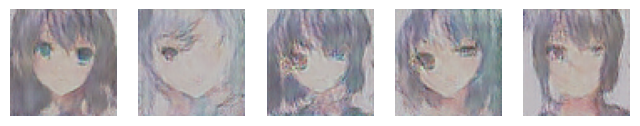

[27/100]: loss_d: 0.172, loss_g: 0.530


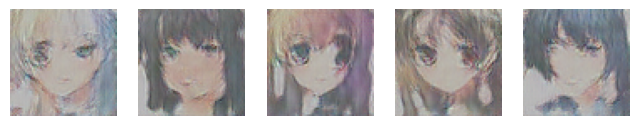

[28/100]: loss_d: 0.170, loss_g: 0.529


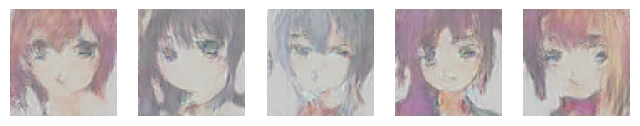

[29/100]: loss_d: 0.177, loss_g: 0.523


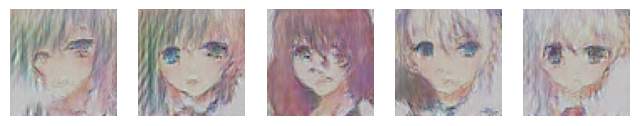

[30/100]: loss_d: 0.177, loss_g: 0.510


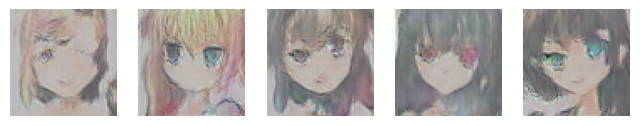

[31/100]: loss_d: 0.176, loss_g: 0.531


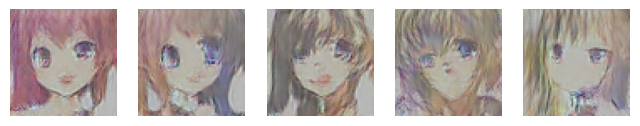

[32/100]: loss_d: 0.177, loss_g: 0.526


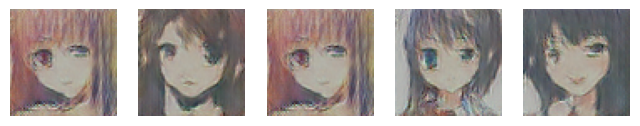

[33/100]: loss_d: 0.176, loss_g: 0.521


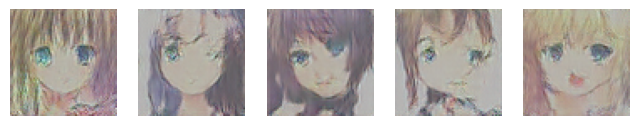

[34/100]: loss_d: 0.180, loss_g: 0.509


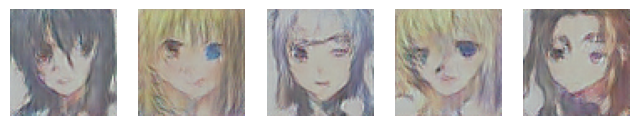

[35/100]: loss_d: 0.180, loss_g: 0.511


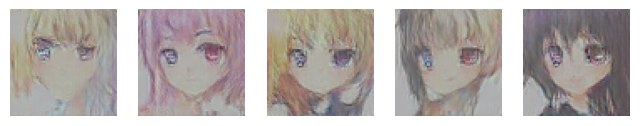

[36/100]: loss_d: 0.182, loss_g: 0.513


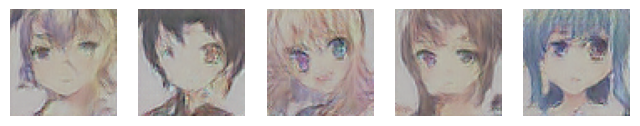

[37/100]: loss_d: 0.179, loss_g: 0.508


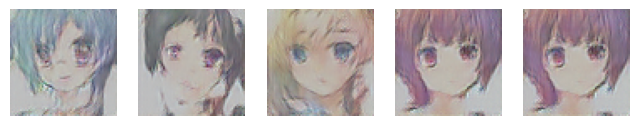

[38/100]: loss_d: 0.179, loss_g: 0.517


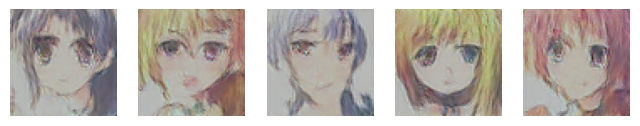

[39/100]: loss_d: 0.181, loss_g: 0.532


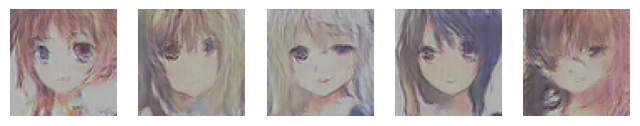

[40/100]: loss_d: 0.174, loss_g: 0.532


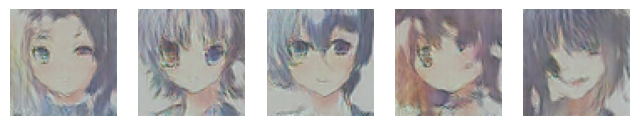

[41/100]: loss_d: 0.181, loss_g: 0.514


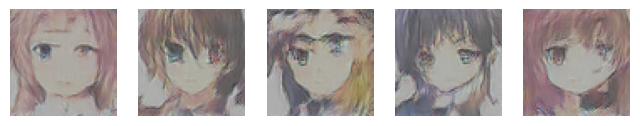

[42/100]: loss_d: 0.168, loss_g: 0.533


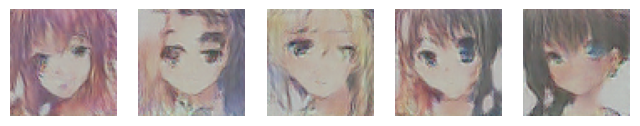

[43/100]: loss_d: 0.169, loss_g: 0.527


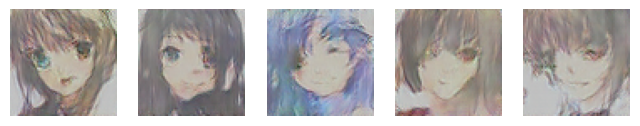

[44/100]: loss_d: 0.170, loss_g: 0.532


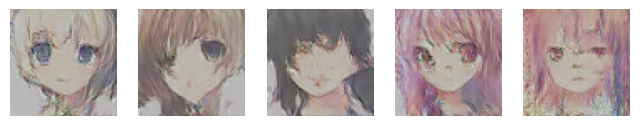

[45/100]: loss_d: 0.165, loss_g: 0.540


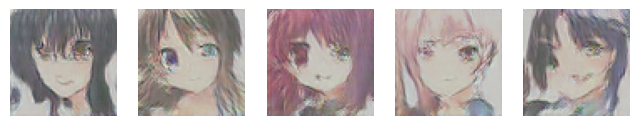

[46/100]: loss_d: 0.162, loss_g: 0.586


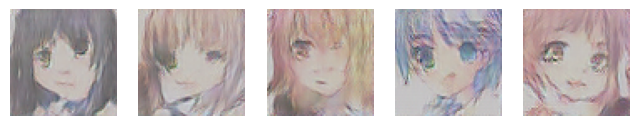

[47/100]: loss_d: 0.161, loss_g: 0.575


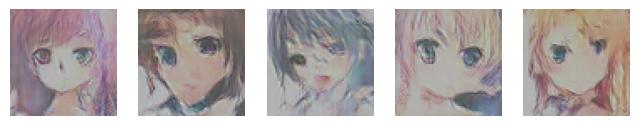

[48/100]: loss_d: 0.157, loss_g: 0.595


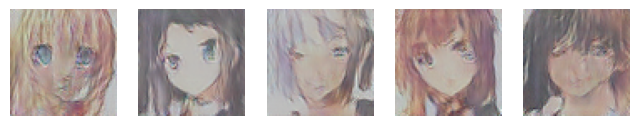

[49/100]: loss_d: 0.151, loss_g: 0.608


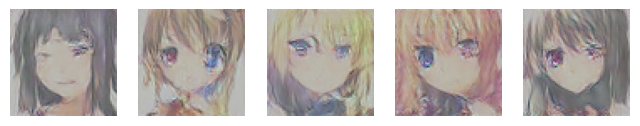

[50/100]: loss_d: 0.151, loss_g: 0.599


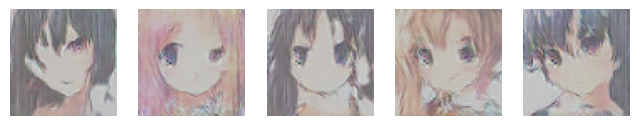

[51/100]: loss_d: 0.149, loss_g: 0.606


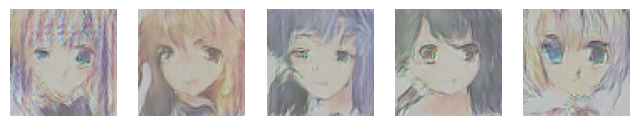

[52/100]: loss_d: 0.140, loss_g: 0.631


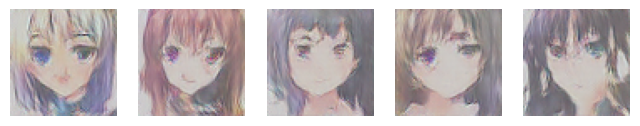

[53/100]: loss_d: 0.136, loss_g: 0.641


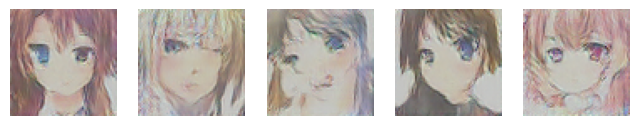

[54/100]: loss_d: 0.138, loss_g: 0.620


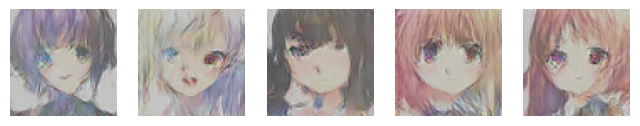

[55/100]: loss_d: 0.148, loss_g: 0.618


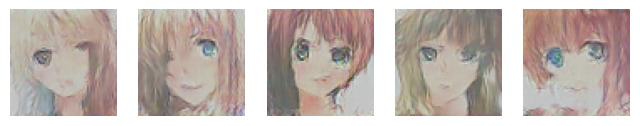

[56/100]: loss_d: 0.134, loss_g: 0.639


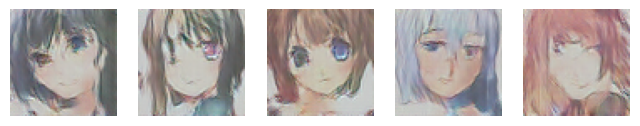

[57/100]: loss_d: 0.138, loss_g: 0.638


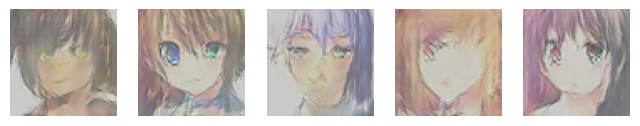

[58/100]: loss_d: 0.130, loss_g: 0.645


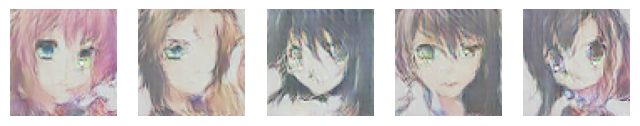

[59/100]: loss_d: 0.137, loss_g: 0.647


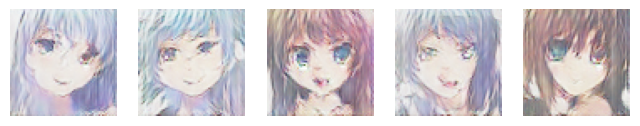

[60/100]: loss_d: 0.145, loss_g: 0.661


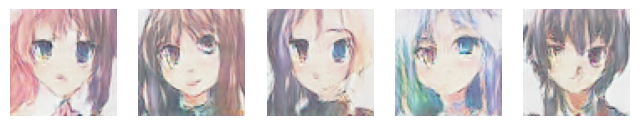

[61/100]: loss_d: 0.146, loss_g: 0.632


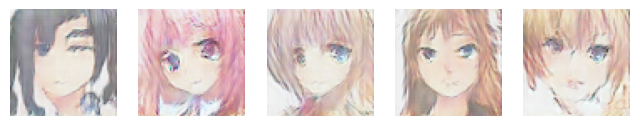

[62/100]: loss_d: 0.152, loss_g: 0.637


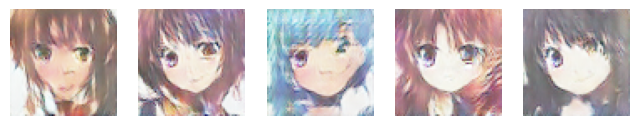

[63/100]: loss_d: 0.156, loss_g: 0.615


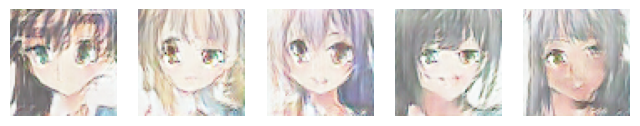

[64/100]: loss_d: 0.147, loss_g: 0.618


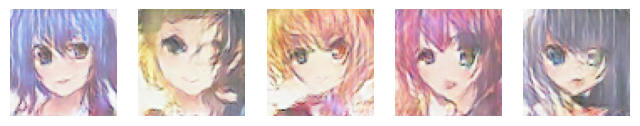

[65/100]: loss_d: 0.154, loss_g: 0.621


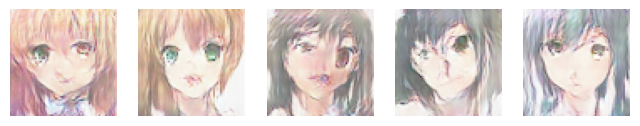

[66/100]: loss_d: 0.154, loss_g: 0.615


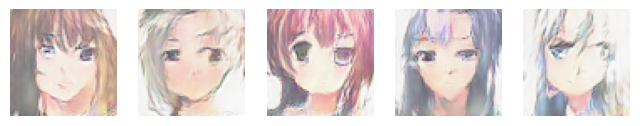

[67/100]: loss_d: 0.159, loss_g: 0.612


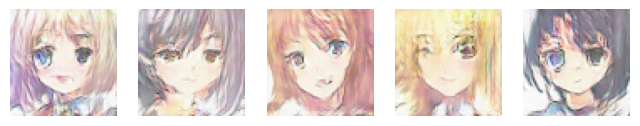

[68/100]: loss_d: 0.154, loss_g: 0.614


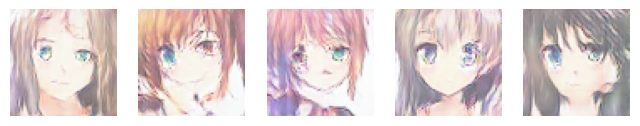

[69/100]: loss_d: 0.152, loss_g: 0.593


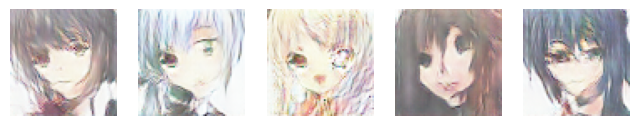

[70/100]: loss_d: 0.160, loss_g: 0.578


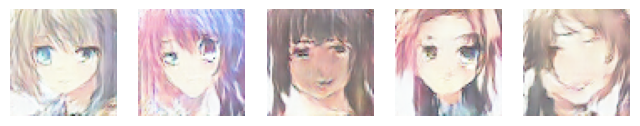

[71/100]: loss_d: 0.165, loss_g: 0.574


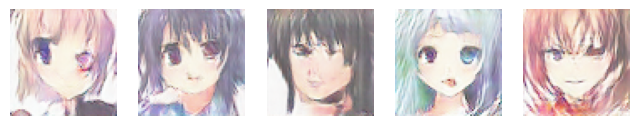

[72/100]: loss_d: 0.167, loss_g: 0.564


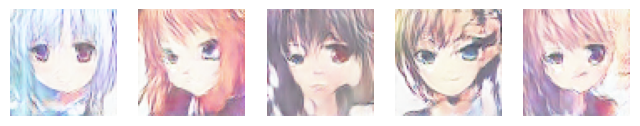

[73/100]: loss_d: 0.167, loss_g: 0.582


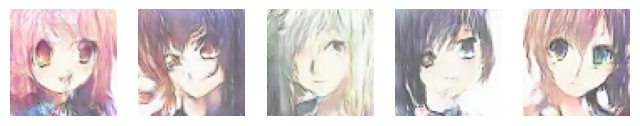

[74/100]: loss_d: 0.160, loss_g: 0.575


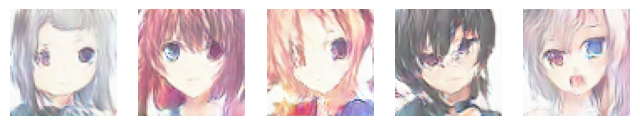

[75/100]: loss_d: 0.166, loss_g: 0.568


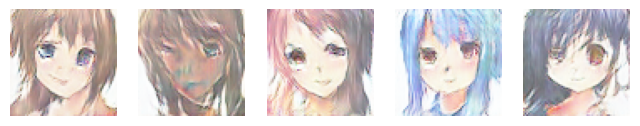

[76/100]: loss_d: 0.165, loss_g: 0.549


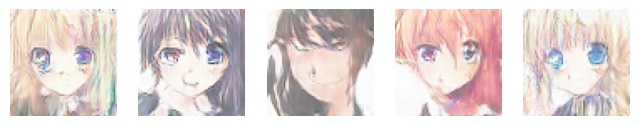

[77/100]: loss_d: 0.169, loss_g: 0.549


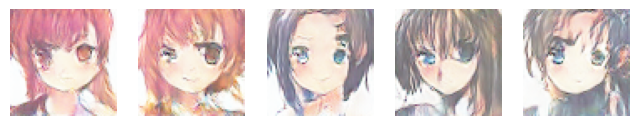

[78/100]: loss_d: 0.168, loss_g: 0.556


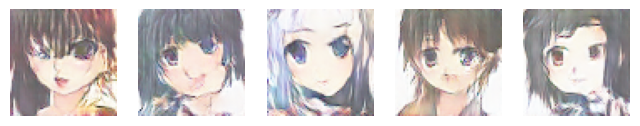

[79/100]: loss_d: 0.174, loss_g: 0.536


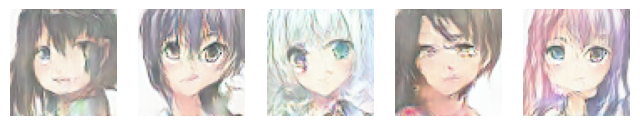

[80/100]: loss_d: 0.170, loss_g: 0.549


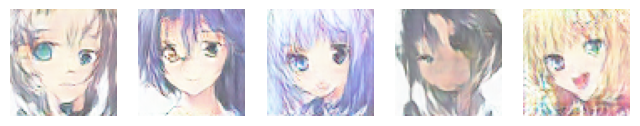

[81/100]: loss_d: 0.171, loss_g: 0.541


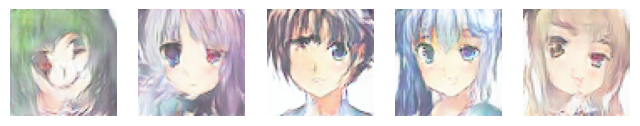

[82/100]: loss_d: 0.170, loss_g: 0.551


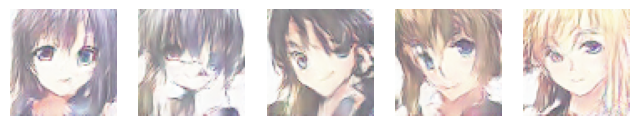

[83/100]: loss_d: 0.168, loss_g: 0.535


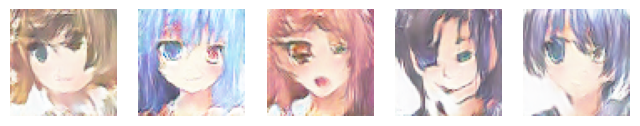

[84/100]: loss_d: 0.166, loss_g: 0.542


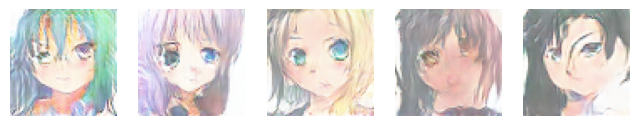

[85/100]: loss_d: 0.168, loss_g: 0.543


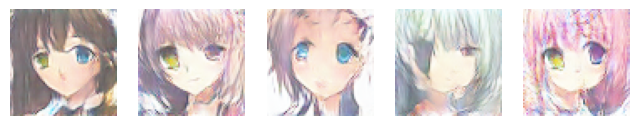

[86/100]: loss_d: 0.168, loss_g: 0.542


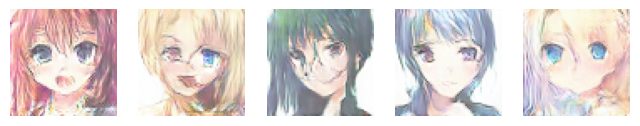

[87/100]: loss_d: 0.170, loss_g: 0.541


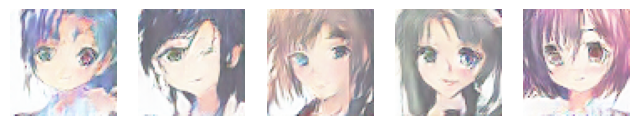

[88/100]: loss_d: 0.167, loss_g: 0.547


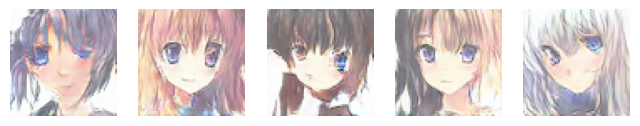

[89/100]: loss_d: 0.167, loss_g: 0.553


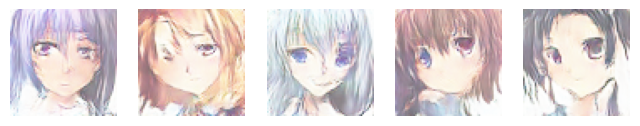

[90/100]: loss_d: 0.167, loss_g: 0.547


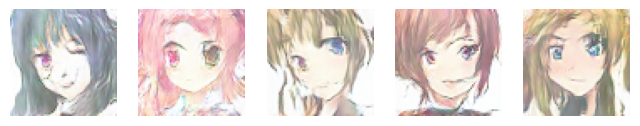

[91/100]: loss_d: 0.165, loss_g: 0.557


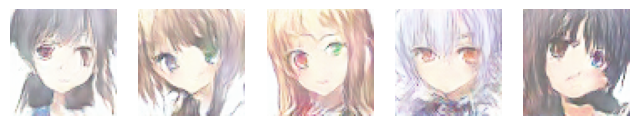

[92/100]: loss_d: 0.165, loss_g: 0.546


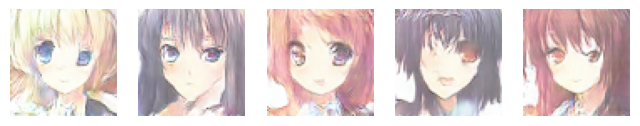

[93/100]: loss_d: 0.162, loss_g: 0.550


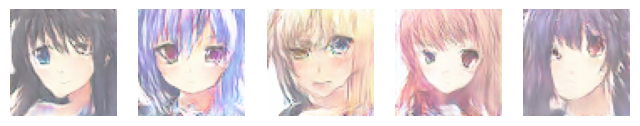

[94/100]: loss_d: 0.162, loss_g: 0.555


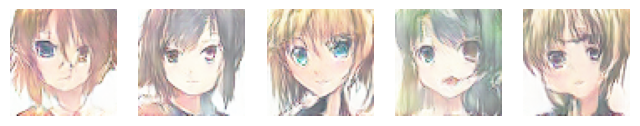

[95/100]: loss_d: 0.165, loss_g: 0.538


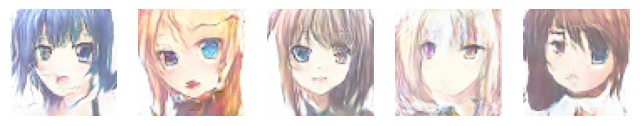

[96/100]: loss_d: 0.160, loss_g: 0.557


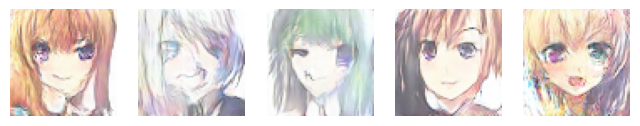

[97/100]: loss_d: 0.163, loss_g: 0.546


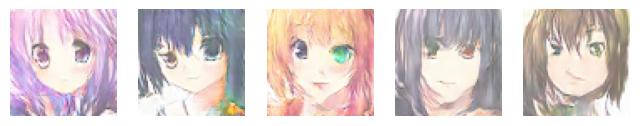

[98/100]: loss_d: 0.163, loss_g: 0.545


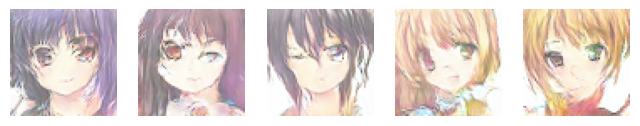

[99/100]: loss_d: 0.162, loss_g: 0.542


In [93]:
n_epoch = 100
for epoch in range(n_epoch):
    G.train(True)
    D_losses, G_losses = [], []
    for batch_idx, (x, _) in enumerate(dl):
        if len(x) != BATCH_SIZE:
            continue
        D_losses.append(D_train(x))
        G_losses.append(G_train(x))
    
    show_example()

    print('[%d/%d]: loss_d: %.3f, loss_g: %.3f' % (
            (epoch), n_epoch, torch.mean(torch.FloatTensor(D_losses)), torch.mean(torch.FloatTensor(G_losses))))